## Imports and global settings

In [2]:
from __future__ import absolute_import, division, print_function

import os
import sys
import numpy as np
import datetime
from keras.models import Sequential, Model
from keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Dense
from keras.layers import Lambda, Dropout, Flatten, Input, BatchNormalization
from keras.optimizers import Adam, Nadam, Adamax, Adadelta, Adagrad, RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.data_utils import get_file
from keras.callbacks import ModelCheckpoint
from keras.utils.np_utils import to_categorical
from keras.regularizers import l1, l1l2, l2

# Utils is in parent folder
sys.path.append("../")
import utils
reload(utils)
from utils import plots, remove_chars_re, plot_files, load_array, save_array

from IPython.display import FileLink
from IPython.core.debugger import Tracer

%matplotlib inline

Using Theano backend.
Using gpu device 0: Tesla K80 (CNMeM is disabled, cuDNN 5103)
/home/ubuntu/anaconda2/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


In [15]:
path = './'
batch_size = 64
image_size = (224, 224)
weights_file = 'vgg16.h5'

## Load the data

#### Create a keras data generator, that flows the images from the specified dir.

In [4]:
def get_batch(path, batch_size, shuffle=True, augument=False, class_mode='categorical'):
    if augument:
        data_generator = ImageDataGenerator(
            rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            zoom_range=0.2,
            shear_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest'
        )
    else:
        data_generator = ImageDataGenerator()
    return data_generator.flow_from_directory(directory=path,
                                              batch_size=batch_size,
                                              target_size=image_size,
                                              shuffle=shuffle,
                                              class_mode=class_mode)

#### Load all sets.

In [5]:
train = get_batch(os.path.join(path, 'train/'),
                  augument=False, batch_size=batch_size)
valid = get_batch(os.path.join(path, 'valid/'), batch_size=batch_size * 2)
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 shuffle=False,
                 class_mode=None)

Found 20180 images belonging to 10 classes.
Found 2244 images belonging to 10 classes.
Found 79726 images belonging to 1 classes.


## Define the model.

Define a convolutional layer

In [6]:
def convolution(model, layers, filters):
    for layer_index in range(layers):
        model.add(ZeroPadding2D((1, 1)))
        model.add(Convolution2D(filters, 3, 3, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    return model

Preprocessing the image: Sub imagenet mean values; Flip channels from RGB to BGR.

In [7]:
def preprocess(image):
    # input is shaped (batch_size, channels, width, height)
    imagenet_means = np.asarray([123.68, 116.779, 103.939]).reshape([3, 1, 1])
    image -= imagenet_means
    # Flip the channels
    return image[:, ::-1, :, :]

Define the model, according to the VGG paper.

In [8]:
def vgg16_model():
    model = Sequential()
    model.add(Lambda(preprocess, input_shape=(3, 224, 224)))
    model = convolution(model, 2, 64)
    model = convolution(model, 2, 128)
    model = convolution(model, 3, 256)
    model = convolution(model, 3, 512)
    model = convolution(model, 3, 512)
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(1000, activation='softmax'))
    return model

model = vgg16_model()

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:621: UserWarning: `output_shape` argument not specified for layer lambda_1 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


Load the precomputed Imagenet weights.

In [9]:
def vgg_load_weights(model, weights_file='vgg16.h5'):
    # If file exists in current dir (keras get_file doesn't check current dir)
    if os.path.exists(weights_file):
        weights = weights_file
    else:
        # Get file uses downloaded weights (in keras cache)
        # or downloads them if not present.
        path = 'http://www.platform.ai/models/'
        weights_file = 'vgg16.h5'
        weights = get_file(weights_file, path + weights_file,
                           cache_subdir='models')
    model.load_weights(weights)
    return model

model = vgg_load_weights(
    model, weights_file=weights_file)

Finally, compile and the model is ready to use.

In [10]:
def model_compile(model, optimizer=None, learning_rate=None):
    if not optimizer:
        optimizer = Adam()
    if learning_rate:
        optimizer.lr.set_value(learning_rate)
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy'])
    return model

model = model_compile(model)

Decode the ids of the 1000 classes in the Imagenet competition for humans.

In [11]:
def setup_imagenet_id_to_class():
    path = 'http://www.platform.ai/models/'
    class_mappings_filename = 'imagenet_class_index.json'
    mappings_file = get_file(class_mappings_filename, path +
                             class_mappings_filename, cache_subdir='models')
    with open(mappings_file, 'r') as f:
        mappings = json.load(f)

    return mappings
# Read the mappings from class id to class name
mappings = setup_imagenet_id_to_class()


def imagenet_id_to_class(id):
    '''A convenience function to extract the class name
    '''
    return mappings[str(id)][1]

Predict some images

In [ ]:
batch = train.next()
images = batch[0][0:5]
predictions = model.predict(images)
predictions_class_ids = np.argmax(predictions, axis=1)
predicted_classes = [imagenet_id_to_class(id) for id in predictions_class_ids]
plots(images, titles=predicted_classes)

## Finetune the model

Pop the 1000 classes last layer off our model, and replace it with layer with as many neurons as we have classes.

In [13]:
def vgg_finetune(model, classes_count):
    # Freeze the original model
    for layer in model.layers:
        layer.trainable = False
    # Replace the last layer
    model.pop()
    model.add(Dense(classes_count, activation='softmax'))
    model = model_compile(model)
    return model

model = vgg_finetune(model, train.nb_class)

In [16]:
weights_file = 'Vanilla-VGG16checkpoint-17.2-14.6.26-00-0.4953.hdf5'
model = vgg_load_weights(model, weights_file)

In [17]:
# model.optimizer.lr.set_value(0.001)
model = model_compile(model)

In [18]:
def get_checkpoint(model_name, period=1):
    now = datetime.datetime.now()
    date_string = "{0}.{1}-{2}.{3}.{4}".format(
        now.day, now.month, now.hour, now.minute, now.second)
    filepath = (model_name + 'checkpoint-' + date_string +
                '-{epoch:02d}-{val_loss:.4f}.hdf5')
    return ModelCheckpoint(filepath, save_weights_only=True,
                           period=period, save_best_only=True)

In [19]:
checkpoint = get_checkpoint('Vanilla-VGG16')
model.fit_generator(train, samples_per_epoch=train.nb_sample,
                    nb_epoch=1,
                    validation_data=valid, nb_val_samples=valid.nb_sample,
                    callbacks=[checkpoint])

Epoch 1/1
20180/20180 [==============================] - 572s - loss: 1.1068 - acc: 0.6504 - val_loss: 0.4669 - val_acc: 0.8476

## Finetuning with features (embeddings) 

### Setup extract features model

In [ ]:
# Review the model to pick a layer to extract features
model.summary()

In [ ]:
# We chose the last conv layer (after max pooling)
features_layer = model.get_layer(name="flatten_1")
features_layer

In [ ]:
# Model to extract the features
features_extract_model = Model(input=model.input,
                               output=features_layer.output)

### Get features/embeddings

In [ ]:
# Get train, valid and test data without augumentation
train = get_batch(os.path.join(path, 'train/'),
                  batch_size=batch_size,
                  augument=False,
                  shuffle=False,
                  )
train_labels = to_categorical(train.classes, nb_classes=train.nb_class)
train_filenames = train.filenames
valid = get_batch(os.path.join(path, 'valid/'),
                  batch_size=batch_size * 2,
                  augument=False,
                  shuffle=False
                  )
valid_labels = to_categorical(valid.classes, nb_classes=valid.nb_class)
valid_filenames = valid.filenames
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 augument=False,
                 shuffle=False,
                 class_mode=None)
test_filenames = test.filenames

In [ ]:
# Sanity check some labels
start = 998
end = 1003
files = [os.path.join(path, 'valid/', filename)
         for filename in valid.filenames[start:end]]
plot_files(files, titles=valid.classes[start:end])

#### Validation set features

In [ ]:
# Extract the valid features
valid_features = features_extract_model.predict_generator(
    che, val_samples=valid.nb_sample)
save_array('valid_features_vgg16.bc', valid_features)
save_array('valid_labels.bc', valid_labels)
save_array('valid_filenames.bc', valid_filenames)

In [10]:
# Load valid features (if we didnt just compute them)
valid_features = load_array('valid_features_vgg16.bc')
valid_labels = load_array('valid_labels.bc')
valid_filenames = load_array('valid_filenames.bc')
valid_features.shape, valid_labels.shape, valid_filenames.shape

((2000, 25088), (2000, 2), (2000,))

#### Train set features

In [ ]:
# Extract the train features
train_features = features_extract_model.predict_generator(
    train, val_samples=train.nb_sample)
save_array('train_features_vgg16.bc', train_features)
save_array('train_labels.bc', train_labels)
save_array('train_filenames.bc', train_filenames)

In [11]:
# Load train features (if we didnt just compute them)
train_features = load_array('train_features_vgg16.bc')
train_labels = load_array('train_labels.bc')
train_filenames = load_array('train_filenames.bc')
train_features.shape, train_labels.shape, train_filenames.shape

((23000, 25088), (23000, 2), (23000,))

#### Test set features

In [ ]:
# Extract the test features
test_features = features_extract_model.predict_generator(
    test, val_samples=test.nb_sample)
save_array('test_features_vgg16.bc', test_features)
save_array('test_filenames.bc', test_filenames)

In [12]:
# Load test features (if we didnt just compute them)
test_features = load_array('test_features_vgg16.bc')
test_filenames = load_array('test_filenames.bc')
test_features.shape, test_filenames.shape

((12500, 25088), (12500,))

### Setup faster model that uses features, instead of images

In [ ]:
# To load the weights for the dense layers,
# we need to set the layers' names to be the same
# as in the saved weights file.

# Review the saved weights file
import h5py
# '/home/ubuntu/.keras/models/vgg16.h5'
#'checkpoint-14.2-15.4.18-00-0.0883.hdf5'
#'checkpoint-01-0.0502-14.2-9.12.56.hdf5'
weights_file = 'VGG16-Featurescheckpoint-17.2-11.24.9-02-0.0797.hdf5'
f = h5py.File(weights_file, mode='r')
[n.decode('utf8') for n in f.attrs['layer_names']]

In [ ]:
# Setup the faster model.
# Use the layer names from the saved weights file.


def setup_model_features(input_shape):
    model = Sequential()
    model.add(Dense(4096, activation='relu', init="he_normal",
                    name='dense_1', input_shape=input_shape))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu', init="he_normal",
                    name='dense_2'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu', init="he_normal",
                    W_regularizer=l2(l=0.01),
                    b_regularizer=l2(l=0.01),
                    name='dense_new_3'))
    model.add(Dropout(0.5))
    model.add(Dense(128, activation='relu', init="he_normal",
                    W_regularizer=l2(l=0.01),
                    b_regularizer=l2(l=0.01),
                    name='dense_new_4'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax', name='dense_new_final'))
    return model

# (512, 7, 7)
model_fast = setup_model_features(input_shape=(25088,))
# Load the weights for current layers only. This works because we named
# them the same way as in the weights file.
# weights = get_file(weights_file, path + weights_file,
#                    cache_subdir='models')
# model_fast.load_weights(weights_file, by_name=True)

In [ ]:
model_fast.summary()

In [ ]:
model_fast = model_compile(model_fast, learning_rate=1e-4)

In [ ]:
checkpoint = get_checkpoint('VGG16-Features')
batch_size = 128
model_fast.fit(train_features, train_labels,
               shuffle=True,
               nb_epoch=5,
               validation_data=(valid_features, valid_labels),
               batch_size=batch_size,
               callbacks=[checkpoint])

## Review Results

In [20]:
# # Get validation predictions
valid = get_batch(os.path.join(path, 'valid/'),
                  batch_size=batch_size * 2,
                  shuffle=False,
                  class_mode=None)
val_results = model.predict_generator(valid, valid.nb_sample)
val_results.shape

Found 2244 images belonging to 10 classes.


In [140]:
predictions = val_results.argmax(axis=1)
probabilities = np.zeros(shape=(val_results.shape[0]))
for index, result in enumerate(val_results):
    probabilities[index] = result[predictions[index]]
filenames = np.array([os.path.join(path, 'valid', filename)
                      for filename in valid.filenames])

classes = valid.classes
# results = np.stack([predictions,
#                     filenames,
#                     classes])
# How many images can we display at once
max_images = 2

In [141]:
def class_id_to_name(ids):
    mapping = {
        0: 'safe',
        1: 'texting right',
        2: 'phone right',
        3: 'texting left',
        4: 'phone left',
        5: 'radio',
        6: 'drinking',
        7: 'reach behind',
        8: 'hair/makeup',
        9: 'talk passenger'
    }
    return [mapping[id] for id in ids]

#### Correct labels at random

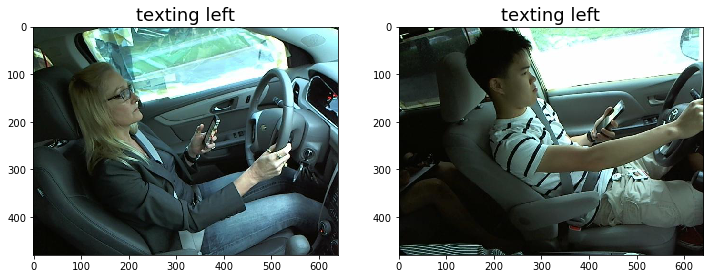

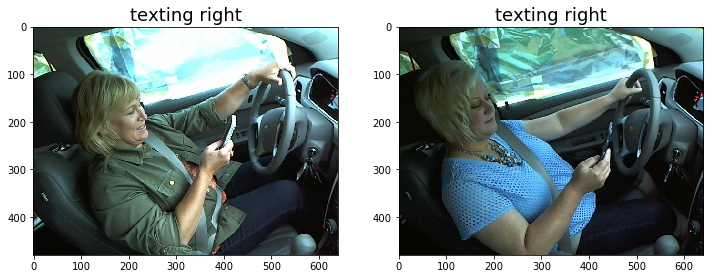

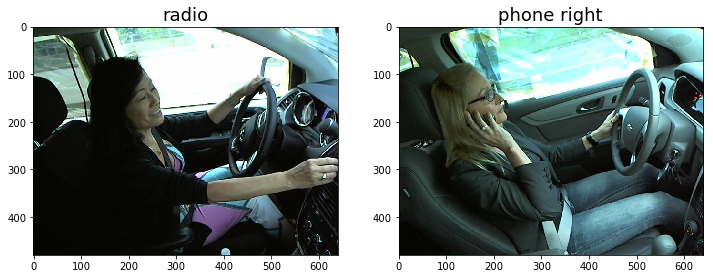

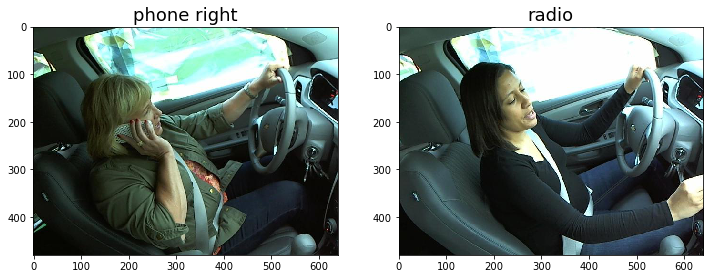

In [24]:
corrects = np.where(np.round(predictions) == classes)[0]
random_correct_indexes = np.random.permutation(corrects)[0:max_images * 4]
plot_files(filenames[random_correct_indexes],
           titles=class_id_to_name(predictions[random_correct_indexes]),
           images_per_row=max_images)

#### Incorrect labels at random

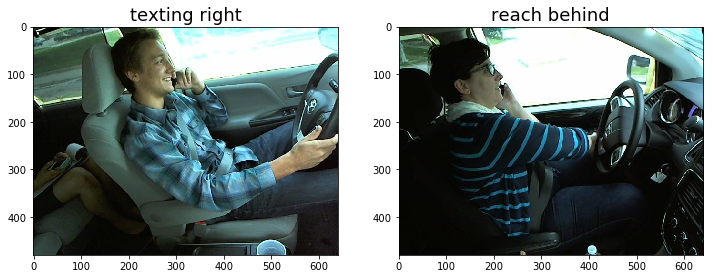

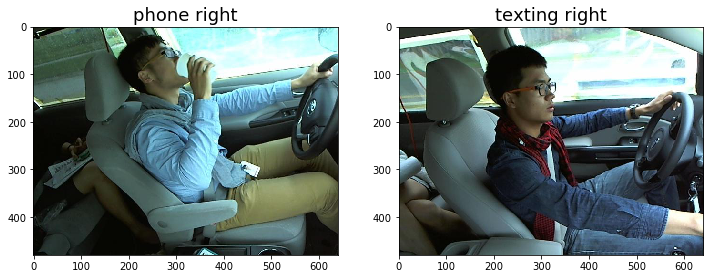

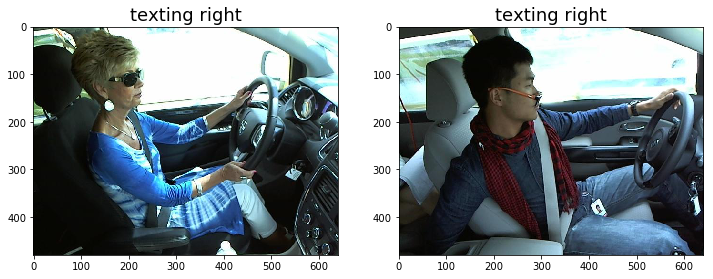

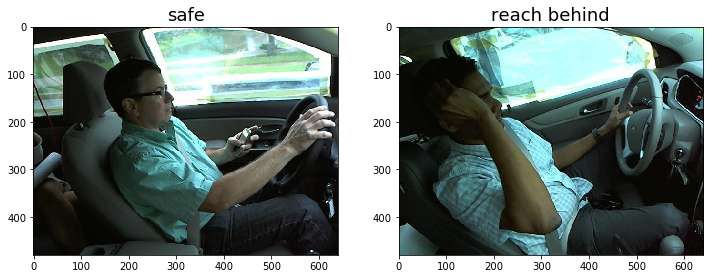

In [26]:
# Since they are a small amount we will display them all
incorrects = np.where(np.round(predictions) != classes)[0]
random_incorrect_indexes = np.random.permutation(incorrects)[0:max_images * 4]
# display random images in the incorrect index, max_images at a time
plot_files(filenames[random_incorrect_indexes],
           titles=class_id_to_name(predictions[random_incorrect_indexes]),
           images_per_row=max_images)

#### Define display for correct or incorrect labels

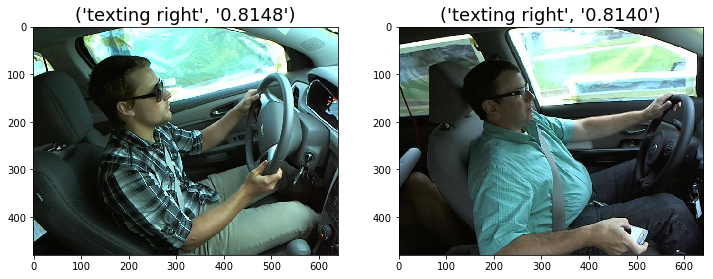

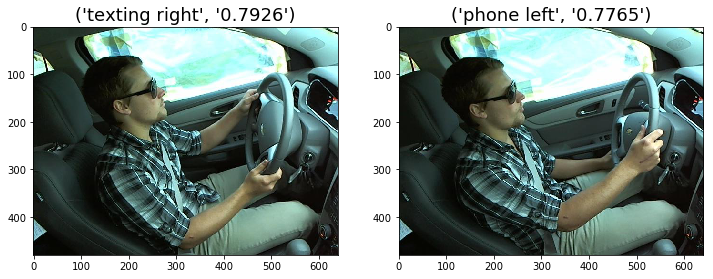

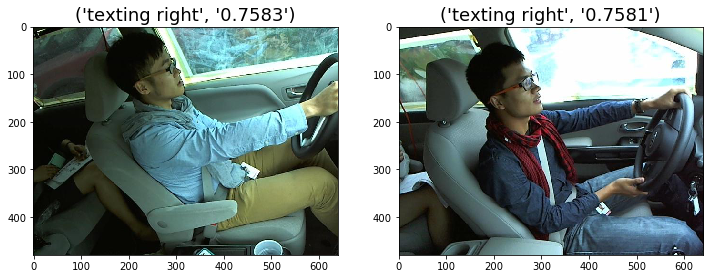

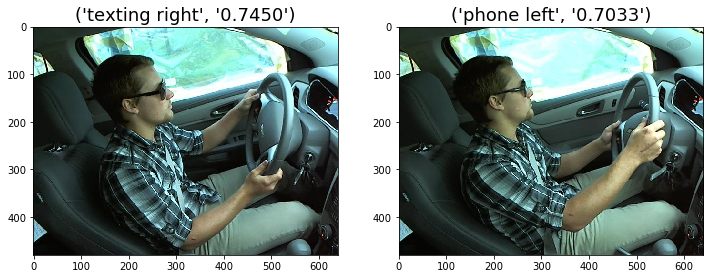

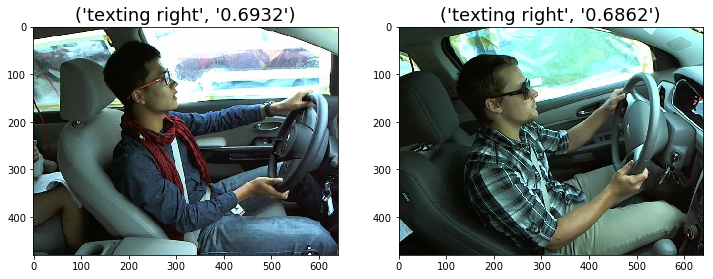

In [219]:
def display_by_prob(class_id, correct=True, max_images=4):
    if correct:
        # Most correct labels
        ids = np.where(
            (classes == class_id)
            & (predictions == classes))[0]
    else:
        # Most incorrect labels
        ids = np.where(
            (classes == class_id)
             & (predictions != classes))[0]
    # Indexes to sort ids
    sort_indexes = np.argsort(probabilities[ids])
    # Sorted
    most_correct = ids[sort_indexes]
    most_correct = most_correct[::-1]
    # Get only a few samples
    most_correct = most_correct[0:max_images]
    images_per_row = 2
    display_probability = ["{:.4f}".format(prob)
                           for prob in
                           probabilities[most_correct]]
    display_class = class_id_to_name(predictions[most_correct])
    titles = zip(display_class,
                 display_probability)
    plot_files(filenames[most_correct],
               images_per_row=images_per_row,
               titles=titles)

#### The most correct labels of each class (high prob and correct)

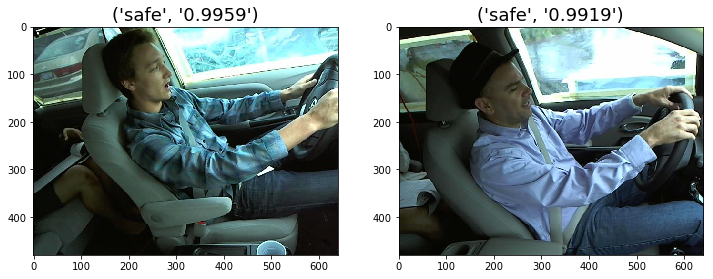

In [198]:
# Correct safe
class_id = 0
display_by_prob(class_id, correct=True, max_images=2)

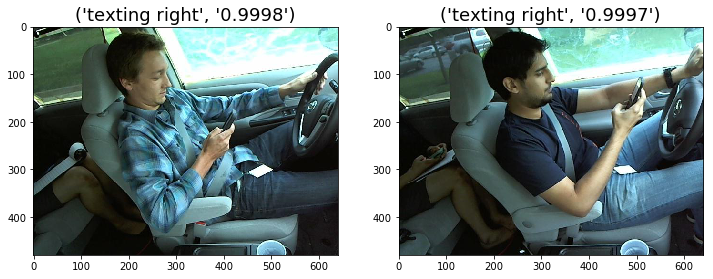

In [199]:
# Correct texting right
class_id = 1
display_by_prob(class_id, correct=True, max_images=2)

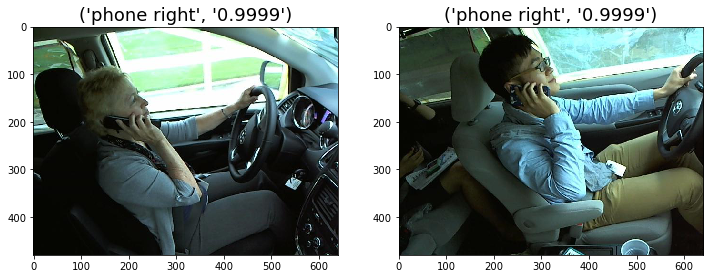

In [200]:
# Correct phone right
class_id = 2
display_by_prob(class_id, correct=True, max_images=2)

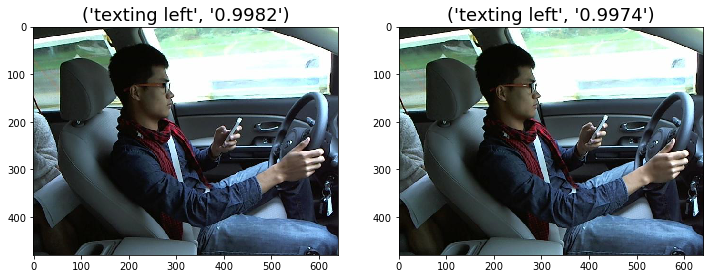

In [201]:
# Correct texting left
class_id = 3
display_by_prob(class_id, correct=True, max_images=2)

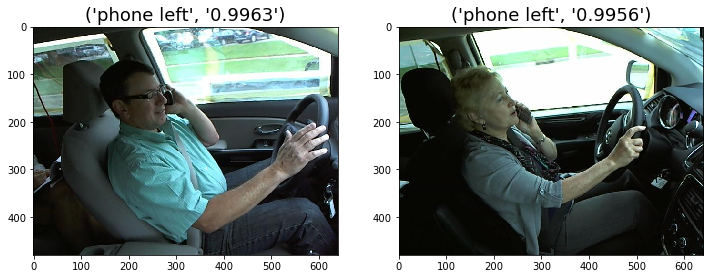

In [202]:
# Correct phone left
class_id = 4
display_by_prob(class_id, correct=True, max_images=2)

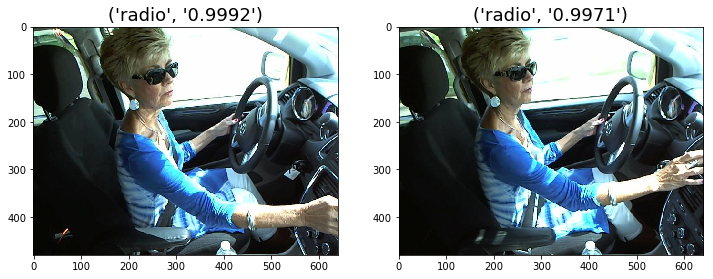

In [203]:
# Correct radio
class_id = 5
display_by_prob(class_id, correct=True, max_images=2)

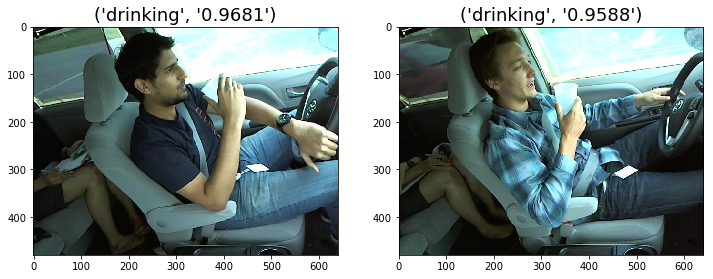

In [204]:
# Correct drinking
class_id = 6
display_by_prob(class_id, correct=True, max_images=2)

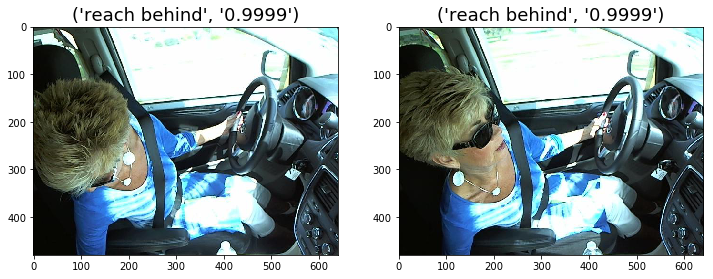

In [205]:
# Correct reach behind
class_id = 7
display_by_prob(class_id, correct=True, max_images=2)

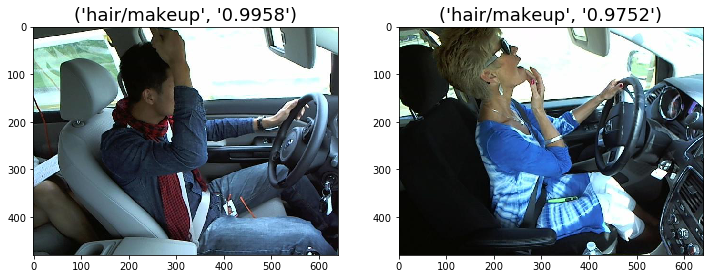

In [206]:
# Correct hair/makeup
class_id = 8
display_by_prob(class_id, correct=True, max_images=2)

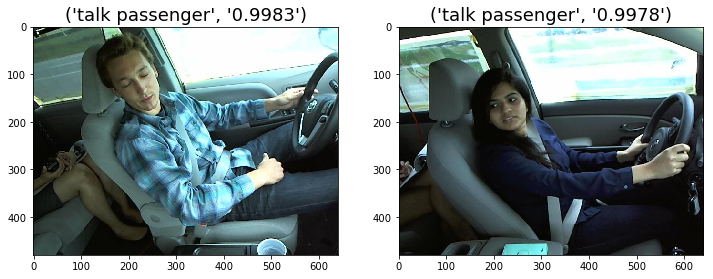

In [207]:
# Correct passenger
class_id = 9
display_by_prob(class_id, correct=True, max_images=2)

#### The most incorrect labels of each class (high prob, but incorrect)


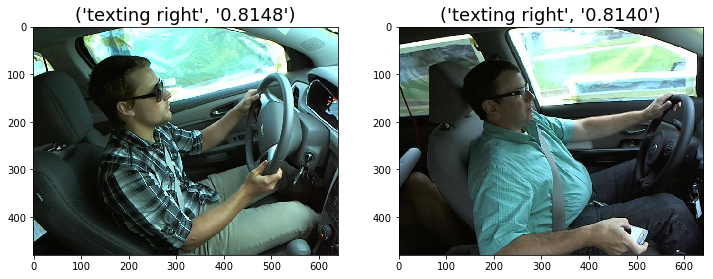

In [220]:
# Correct safe
class_id = 0
display_by_prob(class_id, correct=False, max_images=2)

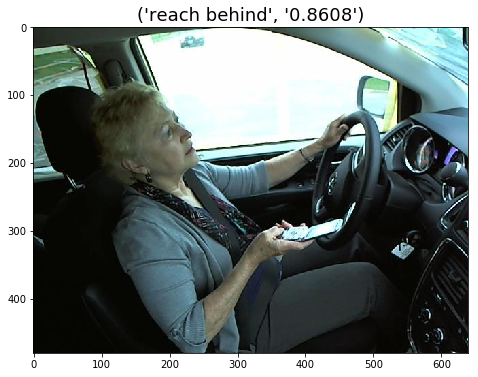

In [221]:
# Correct texting right
class_id = 1
display_by_prob(class_id, correct=False, max_images=2)

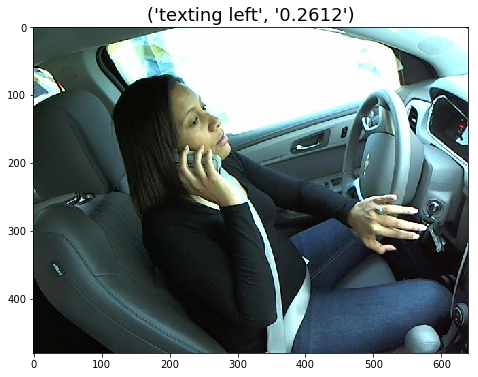

In [222]:
# Correct phone right
class_id = 2
display_by_prob(class_id, correct=False, max_images=2)

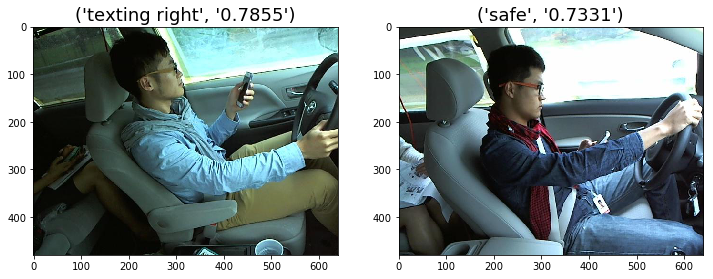

In [223]:
# Correct texting left
class_id = 3
display_by_prob(class_id, correct=False, max_images=2)

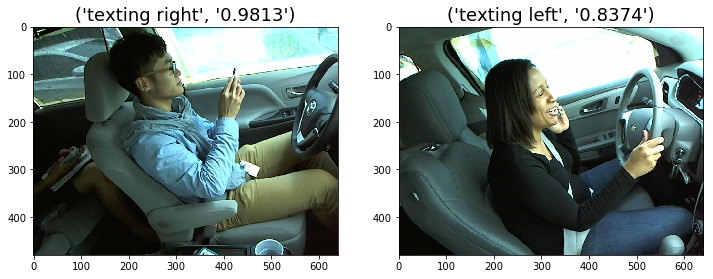

In [224]:
# Correct phone left
class_id = 4
display_by_prob(class_id, correct=False, max_images=2)

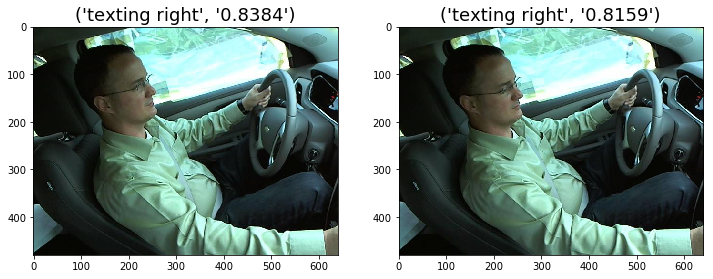

In [225]:
# Correct radio
class_id = 5
display_by_prob(class_id, correct=False, max_images=2)

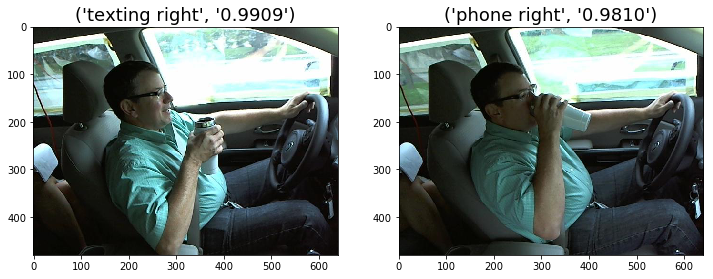

In [226]:
# Correct drinking
class_id = 6
display_by_prob(class_id, correct=False, max_images=2)

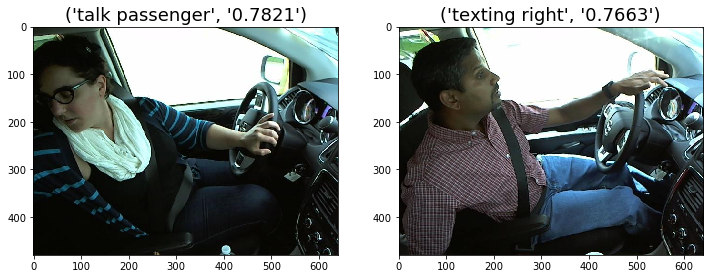

In [228]:
# Correct reach behind
class_id = 7
display_by_prob(class_id, correct=False, max_images=2)

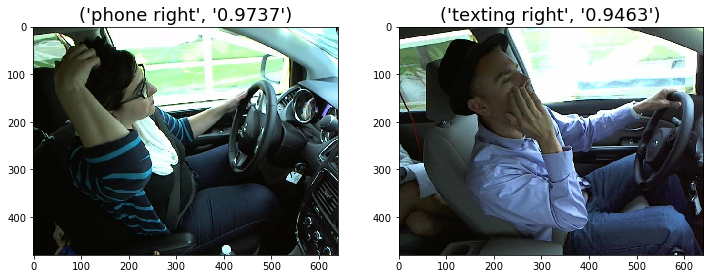

In [229]:
# Correct hair/makeup
class_id = 8
display_by_prob(class_id, correct=False, max_images=2)

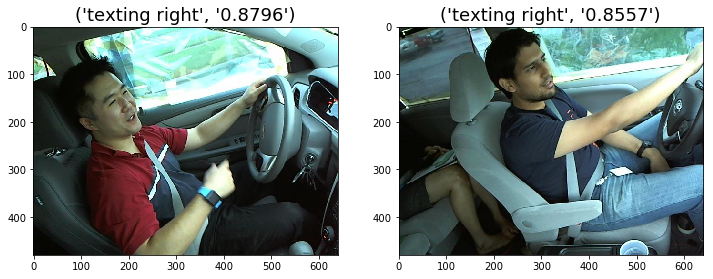

In [230]:
# Correct passenger
class_id = 9
display_by_prob(class_id, correct=False, max_images=2)

#### The most uncertian labels (probability close to 0.5)

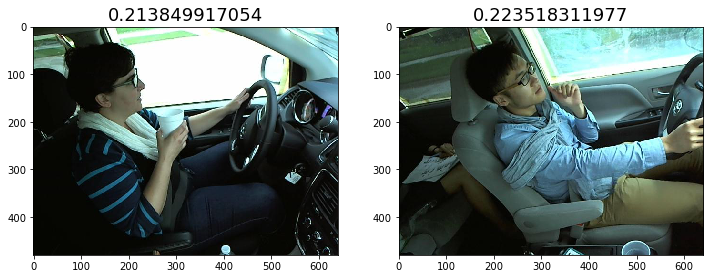

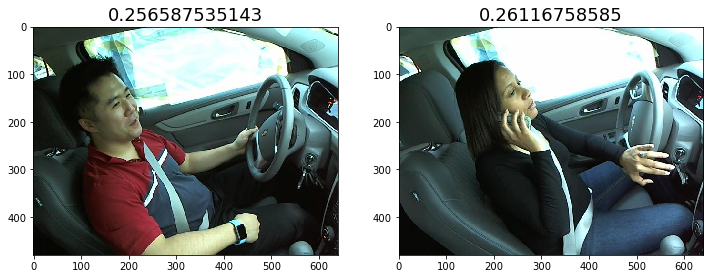

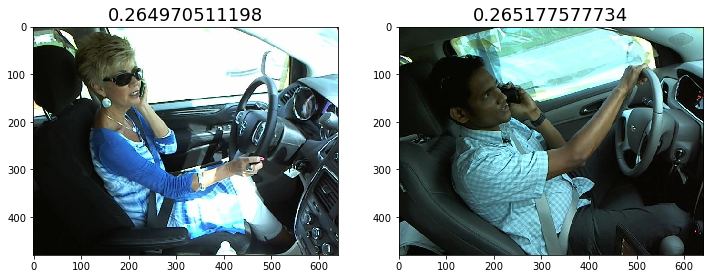

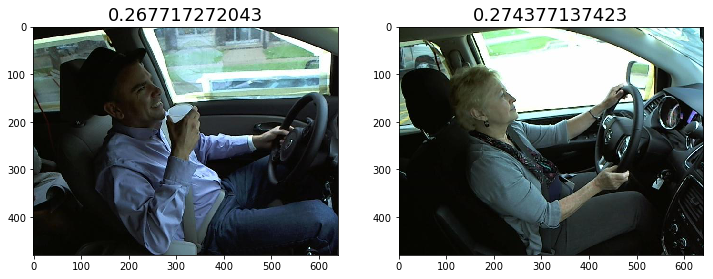

In [233]:
# Since the probabilities sum up to 1 for each image,
# the min probability is the 1 / num_classes
min_certainty = 1 / valid.nb_class
# Get distance to most uncertain
most_uncertain = np.abs(probabilities - min_certainty)
# Sort by distance to most uncertain
sort_indexes = np.argsort(most_uncertain)
# Get only the most uncertain
sort_indexes = sort_indexes[:max_images * 4]
plot_files(filenames[sort_indexes],
           titles=probabilities[sort_indexes],
           images_per_row=max_images)

## Submit results

#### Prepare predictions for test set


In [29]:
test_predictions = model.predict_generator(test, val_samples=test.nb_sample)
# test_predictions = model_fast.predict(test_features, batch_size=batch_size)

In [93]:
# get path to test files
test_filepaths = test.filenames


def filter_test_filepath(filepath):
    '''Utility func to transform 'test/1032.jpg' to 1032
    '''
    filepath = remove_chars_re(filepath, 'test/')
    return filepath
# Format test files as ids
test_ids = [filter_test_filepath(filepath)
            for filepath in test_filepaths]

In [101]:
# Trim the predictions, so that we are not penalized for confident mistakes
predictions_trim = np.clip(test_predictions, 0.001, 0.95)

In [107]:
len(test_ids)

79726

In [109]:
predictions_trim.shape

(79726, 10)

In [113]:
predictions = np.column_stack([test_ids, predictions_trim])

In [116]:
predictions[1]

array(['img_81415.jpg', '0.0957668349147', '0.713034391403', '0.0010000000475', '0.133420571685',
       '0.0273325927556', '0.0010000000475', '0.0010000000475', '0.0010000000475',
       '0.00358349340968', '0.025847600773'], 
      dtype='|S32')

#### Sanity check the results


In [119]:
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 shuffle=False,
                 class_mode=None)
test_batch = test.next()
start = 0

Found 79726 images belonging to 1 classes.


In [120]:
test_batch.shape

(64, 3, 224, 224)

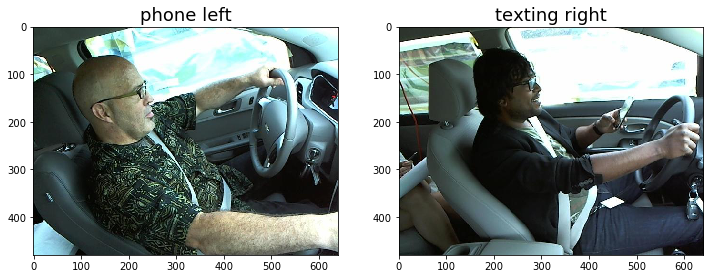

In [135]:
start = start + 2
end = start + 2
full_paths = [os.path.join('test', filename) for filename in test.filenames]
titles = class_id_to_name(np.argmax(predictions_trim[start:end], axis=1))
plot_files(full_paths[start:end], titles=titles)

#### Export the predictions to csv with Pandas.

In [137]:
import pandas as pd
now = datetime.datetime.now()
date_string = "{0}.{1}-{2}.{3}.{4}".format(
    now.day, now.month, now.hour, now.minute, now.second)
filename = ("cats_dogs-{0}.csv".format(date_string))
header = ['img', 'c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']
df = pd.DataFrame(predictions)
df.to_csv(filename, header=header, index=False)
FileLink(filename)

/home/ubuntu/mount/course/distracted_driver/cats_dogs-17.2-16.1.32.csv

#### Submit to kaggle

In [138]:
!kg submit -c 'state-farm-distracted-driver-detection' -m "$date_string" $filename